In [1]:
import pandas as pd
import pysam
import csv
import sys
import re
import collections
import scanpy as sc
import os
import glob

import pandas as pd
from pandas import Series
import glob
import plotly
import plotly.express as px  # import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.io as pio
#pio.templates.default = 'plotly_white'

In [6]:
PATTERN = re.compile(r'(\S+?)\s*"(.*?)"')

In [7]:
    def get_properties_dict(properties_str):
        """
        allow no space after semicolon
        """
        
        if isinstance(properties_str, dict):
            return properties_str

        properties = collections.OrderedDict()
        attrs = properties_str.split(';')
        for attr in attrs:
            if attr:
                m = re.search(PATTERN, attr)
                if m:
                    key = m.group(1)
                    key = key.strip()
                    value = m.group(2)
                    value = value.strip()
                    properties[key] = value

        return properties

In [4]:
/SGRNJ06/randd/USER/cjj/filtered_ref/hs_ensembl_99/Homo_sapiens.GRCh38.99.gtf

SyntaxError: invalid syntax (<ipython-input-4-97c2a7cdaae5>, line 1)

In [8]:
def gtf_reader_iter():
    with open("/SGRNJ06/randd/USER/cjj/filtered_ref/hs_ensembl_99/Homo_sapiens.GRCh38.99.gtf", mode='rt') as f:
        reader = csv.reader(f, delimiter='\t')
        for i, row in enumerate(reader, start=1):
            if len(row) == 0:
                continue
            if row[0].startswith('#'):
                yield row, True, None, None
                continue
            if len(row) != 9:
                sys.exit(f"Invalid number of columns in GTF line {i}: {row}\n")
            if row[6] not in ['+', '-']:
                sys.exit(f"Invalid strand in GTF line {i}: {row}\n")
            properties = get_properties_dict(row[8])
            annotation = row[2]
            if annotation == 'exon':
                if 'gene_id' not in properties:
                    raise GeneIdNotFound(f"Property 'gene_id' not found in GTF line {i}: {row}\n")
            yield row, False, annotation, properties

In [9]:
lncRNA_gene_set = set()
for _row, _is_comment, annotation, properties in gtf_reader_iter():
    if _is_comment:
        continue
    properties = dict(properties)
    if properties["gene_biotype"] == "lncRNA":
        gene_name = properties["gene_name"]
        lncRNA_gene_set.add(gene_name)
#     for key, value in properties.items():
#         if key == "gene_name":
#             gene_name = value
#         if value == "lncRNA":
#             lncRNA_gene_set.add(gene_name)

In [ ]:
lncRNA_gene_set

In [11]:
dict(properties)

{'gene_id': 'ENSG00000268674',
 'gene_version': '2',
 'transcript_id': 'ENST00000601199',
 'transcript_version': '2',
 'exon_number': '1',
 'gene_name': 'AC213203.1',
 'gene_source': 'ensembl',
 'gene_biotype': 'protein_coding',
 'transcript_name': 'AC213203.1-201',
 'transcript_source': 'ensembl',
 'transcript_biotype': 'protein_coding',
 'tag': 'basic',
 'transcript_support_level': 'NA'}

In [12]:
len(lncRNA_gene_set)

16877

In [13]:
matrix_file = "/SGRNJ06/randd/USER/cjj/celedev/rna/lncRNA/20231206/count/CL961431/"

In [14]:
adata = sc.read_10x_mtx(matrix_file,var_names='gene_symbols',)

In [15]:
sample = matrix_file.split('/')[-1]

In [16]:
adata.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.5', 'AL627309.4', 'AP006222.2', 'AL732372.1',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.3',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.4', 'AC213203.1'],
      dtype='object', length=37493)

In [17]:
adata.var["lncRNA"] = adata.var_names.str.upper().isin(lncRNA_gene_set)

In [18]:
adata.var

,gene_ids,lncRNA
MIR1302-2HG,ENSG00000243485,True
FAM138A,ENSG00000237613,True
OR4F5,ENSG00000186092,False
AL627309.1,ENSG00000238009,True
AL627309.3,ENSG00000239945,True
...,...,...
AC233755.2,ENSG00000277856,False
AC233755.1,ENSG00000275063,False
AC240274.1,ENSG00000271254,False
AC213203.4,ENSG00000277475,False


In [19]:
adata.var.value_counts("lncRNA")

lncRNA
False    20678
True     16815
dtype: int64

In [20]:
        sc.pp.calculate_qc_metrics(
            adata,
            qc_vars=["lncRNA"], 
            percent_top=None,
            use_raw=False,
            log1p=False, 
            inplace=True
        )

In [21]:
adata.obs

,n_genes_by_counts,total_counts,total_counts_lncRNA,pct_counts_lncRNA
AACACACAGAACGCTAGTACGTACTGT,522,833.0,84.0,10.084034
AACACACAGAACGCTAGTTATGCTCTC,454,682.0,103.0,15.102640
AACACACAGAACGCTAGTTCACGTCAT,3611,12025.0,640.0,5.322246
AACACACAGAACGTCCAAAGAATCCGG,1996,4810.0,376.0,7.817048
AACACACAGAACGTCCAACAGTAAGAG,2945,9583.0,878.0,9.162058
...,...,...,...,...
TGTGGACACTTACACGACGGAGAGGAA,632,1001.0,63.0,6.293706
TGTGGACACTTACACGACTACTCCATC,609,987.0,145.0,14.690983
TGTGGACACTTGAGACAGCGTGGCTAT,3312,10382.0,1023.0,9.853593
TGTGGACACTTGGTGACCACTGGTTCC,2282,6045.0,568.0,9.396195


In [22]:
df = adata.obs

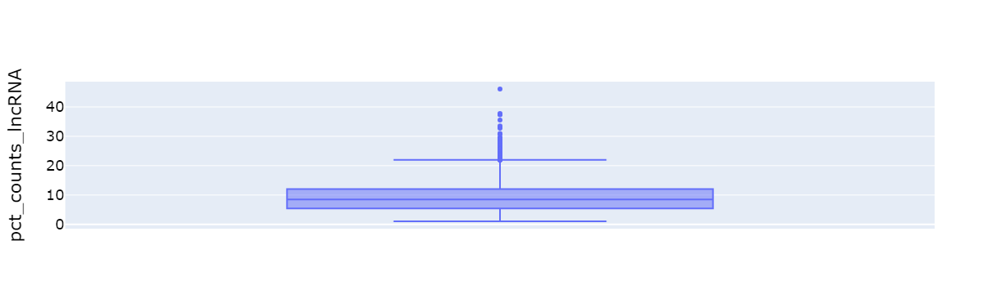

In [23]:
fig = go.Figure()
fig.add_trace(go.Box(y=list(df.pct_counts_lncRNA),name=f"{sample}"))
# fig.add_trace(go.Box(y=list(df.UMIs_Mapped_To_TRB),name="UMIs_Mapped_To_TRB"))
# fig.add_trace(go.Box(y=list(df.UMIs_Mapped_Confidently_To_VJ_Gene),name="UMIs_Mapped_Confidently_To_VJ_Gene"))
fig.update_layout(title={#"text":f'{sample}',
                         'y':0.98, 'x':0.40, 'xanchor': 'center', 'yanchor': 'top'},
                          yaxis_title = "pct_counts_lncRNA", font=dict(size=18,color="Black"))

#fig.write_image(f"{OUT_PATH}/boxplot.png", scale=4, width=1680, height=1024)
fig.show()

In [36]:
matrix_files = os.listdir("/SGRNJ06/randd/USER/cjj/celedev/rna/lncRNA/20231206/count/")

In [37]:
matrix_files

['CR961431', 'CL961431']

In [38]:
matrix_files = [f"/SGRNJ06/randd/USER/cjj/celedev/rna/lncRNA/20231206/count/{i}" for i in matrix_files]

In [39]:
matrix_files

['/SGRNJ06/randd/USER/cjj/celedev/rna/lncRNA/20231206/count/CR961431',
 '/SGRNJ06/randd/USER/cjj/celedev/rna/lncRNA/20231206/count/CL961431']

lncRNA
False    20678
True     16815
dtype: int64
lncRNA
False    20678
True     16815
dtype: int64


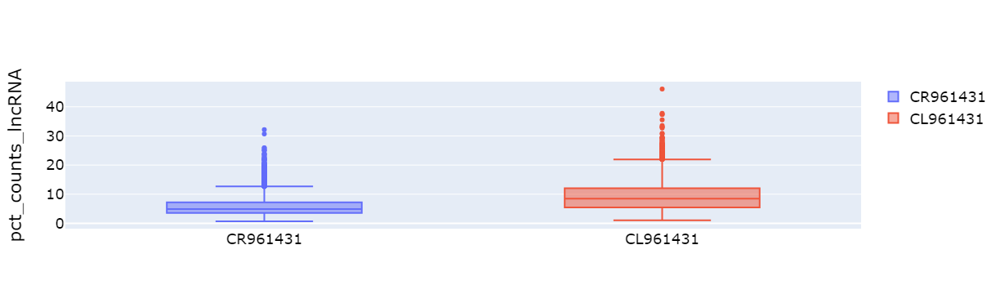

In [40]:
fig = go.Figure()

for matrix_file in matrix_files:
    adata = sc.read_10x_mtx(matrix_file,var_names='gene_symbols',)
    sample = matrix_file.split('/')[-1]
    adata.var["lncRNA"] = adata.var_names.str.upper().isin(lncRNA_gene_set)
    print(adata.var.value_counts("lncRNA"))

    sc.pp.calculate_qc_metrics(
        adata,
        qc_vars=["lncRNA"], 
        percent_top=None,
        use_raw=False,
        log1p=False, 
        inplace=True
    )
    
    df = adata.obs
    
    fig.add_trace(go.Box(y=list(df.pct_counts_lncRNA),name=f"{sample}"))

fig.update_layout(title={#"text":f'{sample}',
                        'y':0.98, 'x':0.40, 'xanchor': 'center', 'yanchor': 'top'},
                        yaxis_title = "pct_counts_lncRNA", font=dict(size=18,color="Black"))
#fig.write_image(f"{OUT_PATH}/boxplot.png", scale=4, width=1680, height=1024)
fig.show()

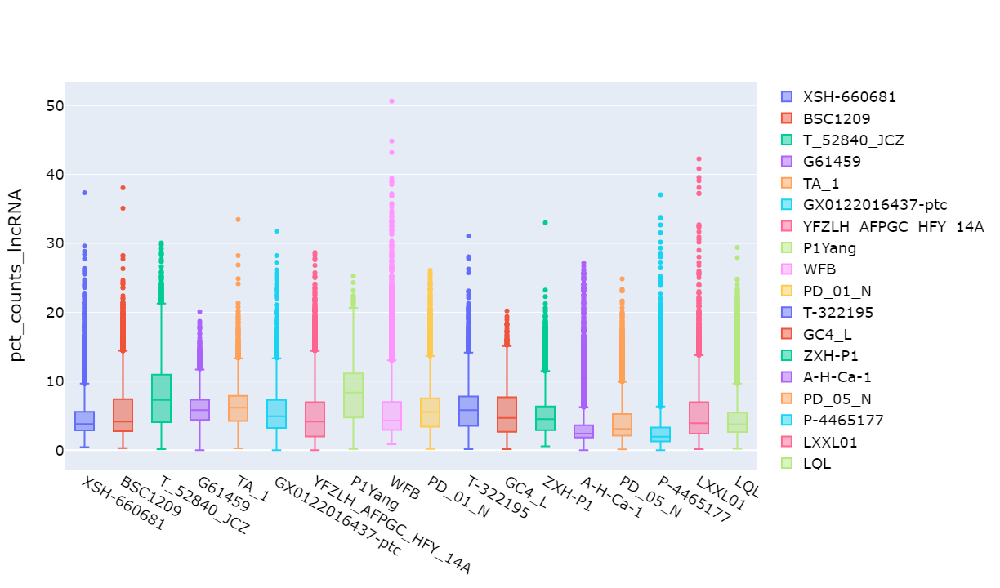

In [155]:
fig.write_image("/SGRNJ06/randd/USER/cjj/celedev/rna/lncRNA/20231206/boxplot.pdf", scale=4, width=2560, height=1440)
fig.show()